## Free Text Analysis

Process for this analysis / NLP Approach

> 1. Combine All Text from All Row
> 2. Clean Symbol and other punctuation
> 3. Lowercase all text
> 4. Tokenization Process
> 5. Remove Common Word/ Stop Word in Indonesian
> 6. Stemming and Lemmatization
> 7. Remove Invalid Word using Regex
> 8. Count Word Frequencies
> 9. Count Word Frequencies using N-Gram (1 and 2)

All process above will breakdown by :
> 1. All Text Description
> 2. All Text Description per Categories

In [1]:
# for getting metabase question
import os
import sys
os.environ["FERNET_KEY"] = "hZKy6btwrDyFwpfnZX7H5o25QebMTze7uYIWvQzwH_Y="
os.environ["MB_DB_URL"] = "gAAAAABmBUgLTCb0w62-C1XKGurLISMIZeeCoryRYSuhu7sqyQPJrPGPioVhj8usN1Z2FzMiHDmiFJ8E6yVXgoJeegfIuKyxmHG1KOaIegAbEX3cZ8lw6s07njv3HY5S_Yu1ggID78P9YTGyKckGb9XYtqE0gmOXcHuH-UXOWcQ2wCV8GjMchUaerYXsXHDUQw8jtVk3ZN_KOnPKOtHdvTjaNnKLa61F1T-rjoOLDqdPFroNlnpNQThC7jPaRMtiQk0RKtzyY8mq"
sys.path.append("/home/ops/app/jupyterhub/common")

In [2]:
import pandas as pd
import numpy as np
import re
import string
import matplotlib.pyplot as plt
import plotly.express as px
import PIL.Image

from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
from sklearn.feature_extraction.text import CountVectorizer
from wordcloud import WordCloud, STOPWORDS
from metabase import get_df_from_question

In [3]:
image_mask = np.array(PIL.Image.open("efishery logo.jpg"))

In [4]:
# Get Dataset
dataset = get_df_from_question(50065)

In [5]:
dataset.head()

,complaint_id,complaint_type,complaint_priority,category,sub_category,source_app,description,level_complaint,streamline
0,CX/TP/01599,Request,Low,Pertanyaan Umum,Lainnya,QR,Nama :harin rosid\nAlamat : made utara \nKota ...,1,Upstream
1,CX/TP/02169,Request,Low,Non Pakan,GI - Non Pakan,QR,Nama : Werri\nAlamat : KBP Padalarang \nKota :...,1,Upstream
2,CX/TP/03475,Request,Low,Kabayan,Pertanyaan Umum,QR,Nama : Bambang gunawan\nAlamat : jl.martapura ...,1,Upstream
3,CX/TP/01558,Request,Medium,Feeder Ikan,Kebutuhan Teknisi Feeder Ikan,eFeeder App,Feeder belum pernah dipakai belum tahu cara se...,2,Upstream
4,CX/TP/03499,Request,Low,Pertanyaan Umum,Product Non eFishery,QR,sudah isi data tapi pinjaman tidak cair cair,1,Upstream


#### Create General Function

In [6]:
# Regex pattern to match valid Indonesian words (alphabetic and hyphen)
VALID_PATTERN = re.compile(r'^[a-zA-Z\-]+$')

# Regex pattern to match words with double or triple identical adjacent letters
DOUBLE_TRIPLE_PATTERN = re.compile(r'(.)\1{1,2}')

# Step 0: Combine all text from all rows into one big text
def combine_text(df, text_column):
    return ' '.join(df[text_column])

# Step 1: Clean symbols in sentences
def clean_symbols(text):
    text = re.sub(f"[{re.escape(string.punctuation)}]", " ", text)
    text = re.sub(r'[^\w\s]', ' ', text)
    text = re.sub(r'https?:\/\/\S*', ' ', text, flags=re.MULTILINE)
    text = re.sub('[^a-zA-Z]', ' ', text)
    return text

# Step 2: Make sentences lowercase
def to_lowercase(text):
    return text.lower()

# Step 3: Tokenization process
def tokenize(text):
    return word_tokenize(text)

# Step 4: Remove common words in Indonesian
def remove_stopwords(tokens):
    more_stopword = ['dengan', 'ia','bahwa','oleh', 'alamat', 'no', 'telp', 
                     'notelp', 'noto', 'wa', 'nama', 'jl', 'cara', 'kota', 'karna',
                     'januari', 'februari', 'maret', 'april', 'mei', 'juni', 'agustus',
                     'september', 'oktober', 'november', 'desember']
    
    stop_words = set(stopwords.words('indonesian') + more_stopword)
    # stop_words = stop_words+more_stopword

    common_names = set([
    'agus', 'andi', 'budi', 'cahyo', 'dedi', 'edi', 'farid', 'gina', 'hadi',
    'iwan', 'joko', 'kiki', 'lisa', 'mira', 'nina', 'oko', 'putri', 'ratna', 
    'sari', 'tini', 'usman', 'vina', 'wawan', 'yani', 'zain', 'indra', 'ikhsan',
    'praja', 'prayitno', 'adi', 'nanda', 'adnan'])

    indonesian_cities = set([
    'jakarta', 'bandung', 'surabaya', 'medan', 'bekasi', 'tangerang', 
    'depok', 'semarang', 'palembang', 'makassar', 'bogor', 'malang', 
    'gresik', 'jatiasih', 'cikampek', 'karawang'])
    
    return [word for word in tokens if word not in stop_words
                                        and word not in common_names
                                        and word not in indonesian_cities]

# Step 5: Apply stemming and lemmatization
def stem_and_lemmatize(tokens):
    factory = StemmerFactory()
    stemmer = factory.create_stemmer()
    return [stemmer.stem(word) for word in tokens]

# Step 6: Remove invalid words using regex
def remove_invalid_words(tokens):
    # Remove words that do not match valid pattern or contain double/triple identical letters
    return [
        word for word in tokens
        if len(word) > 3 and VALID_PATTERN.match(word)
        and not DOUBLE_TRIPLE_PATTERN.search(word)
    ]

# Step 7: Combine all clean words into sentences and combine them into a list
def tokens_to_sentence(tokens):
    return ' '.join(tokens)

# Step 8: Create a count vector to calculate the frequency of each word in the big text with N-grams
def count_vectorize(text, ngram_range=(1, 2)):
    vectorizer = CountVectorizer(ngram_range=ngram_range)
    X = vectorizer.fit_transform([text])
    return X, vectorizer.get_feature_names_out()

In [7]:
def word_frequencies(dataset, column, type, n_gram):
    big_text = combine_text(dataset, column)

    # Step 1
    clean_text = clean_symbols(big_text)
    
    # Step 2
    clean_text = to_lowercase(clean_text)
    
    # Step 3
    tokens = tokenize(clean_text)
    
    # Step 4
    tokens = remove_stopwords(tokens)
    
    # Step 5
    tokens = stem_and_lemmatize(tokens)
    
    # Step 6
    tokens = remove_invalid_words(tokens)
        
    # Step 7
    clean_sentence = tokens_to_sentence(tokens)
    
    # Step 8
    count_vector, feature_names = count_vectorize(clean_sentence, ngram_range=(n_gram, n_gram))
    
    
    # Display frequencies
    word_freq = count_vector.toarray().flatten()
    freq_df = pd.DataFrame({'Word': feature_names, 'Frequency': word_freq, 'Type':type})

    return freq_df

### All Text Description

#### All Text (N-Gram 1)

In [8]:
# N-Gram 1
freq_df_gram1 = word_frequencies(dataset, 'description', 'n_gram1', 1)

In [9]:
freq_df_gram1.sort_values(by='Frequency', ascending=False)

,Word,Frequency,Type
3567,member,1582,n_gram1
5897,tani,1364,n_gram1
4139,order,1350,n_gram1
3715,mohon,1298,n_gram1
4212,pakan,1260,n_gram1
...,...,...,...
2756,kasoh,1,n_gram1
2754,kasiak,1,n_gram1
2752,kasbon,1,n_gram1
2751,kasar,1,n_gram1


In [10]:
# Get IQR frequencies to get top Word
q75, q25 = np.percentile(freq_df_gram1.Frequency.unique(), [75 ,25])
iqr = q75 - q25

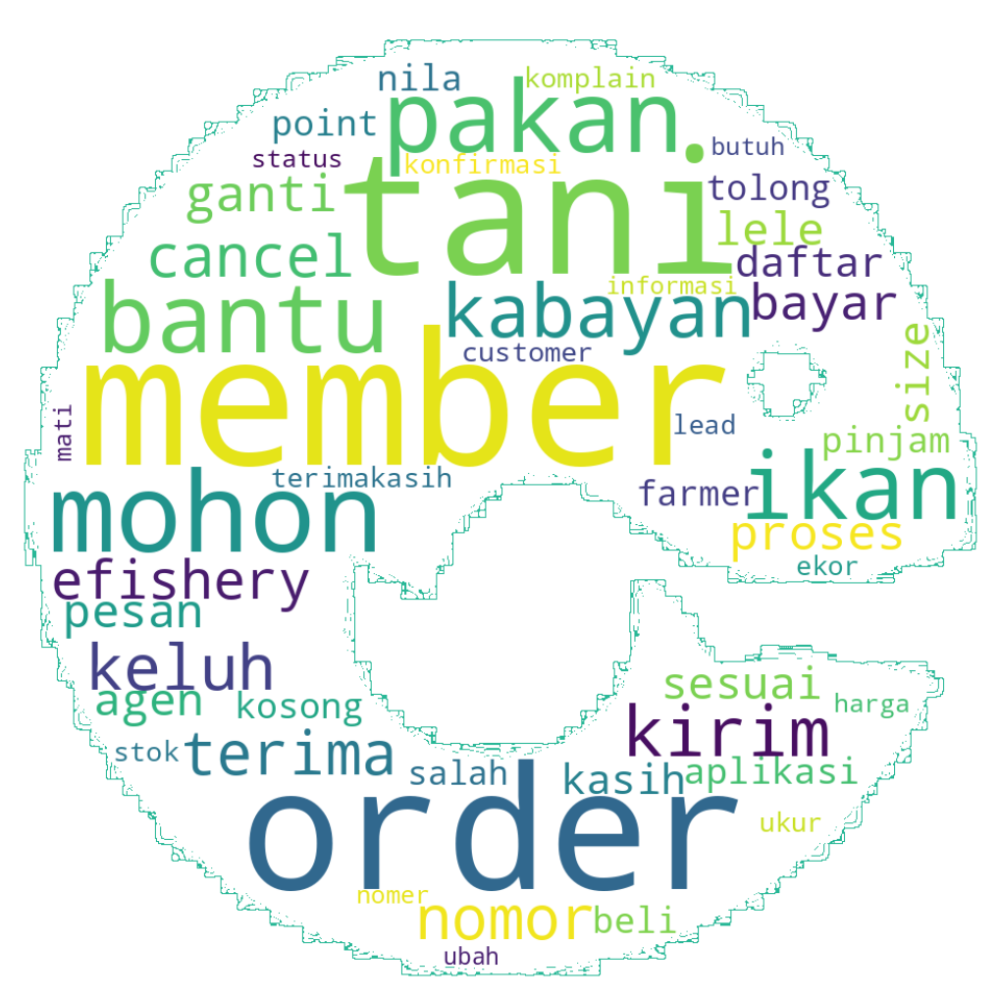

In [11]:
# Create WordCloud Visualization
wordcloud = WordCloud(
    width = 2000,
    height = 1000,
    mask = image_mask,
    contour_color = '#27B796',
    contour_width=1,
    background_color = 'white',
    max_words=100).generate_from_frequencies(frequencies=dict(freq_df_gram1[freq_df_gram1.Frequency > iqr][['Word', 'Frequency']].values))
fig = plt.figure(
    figsize = (10, 15),
    facecolor = 'w',
    edgecolor = 'w')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [12]:
# Result of Most Important Word
freq_df_gram1[freq_df_gram1.Frequency > iqr][['Word', 'Frequency']].sort_values(by='Frequency', ascending=False)

,Word,Frequency
3567,member,1582
5897,tani,1364
4139,order,1350
3715,mohon,1298
4212,pakan,1260
510,bantu,1191
2251,ikan,1097
2597,kabayan,936
2918,kirim,819
2822,keluh,672


#### All Text (N-Gram 2)

In [13]:
# N-Gram 2
freq_df_gram2 = word_frequencies(dataset, 'description', 'n_gram2', 2)

In [14]:
freq_df_gram2.sort_values(by='Frequency', ascending=False)

,Word,Frequency,Type
15140,mohon bantu,924,n_gram2
14618,member member,869,n_gram2
14609,member keluh,550,n_gram2
3675,cancel order,310,n_gram2
24186,terima kasih,266,n_gram2
...,...,...,...
9872,kabayan laku,1,n_gram2
9871,kabayan kontak,1,n_gram2
9869,kabayan komoditas,1,n_gram2
9868,kabayan komis,1,n_gram2


In [15]:
# Get IQR frequencies to get top Word
q75, q25 = np.percentile(freq_df_gram2.Frequency.unique(), [75 ,25])
iqr = q75 - q25

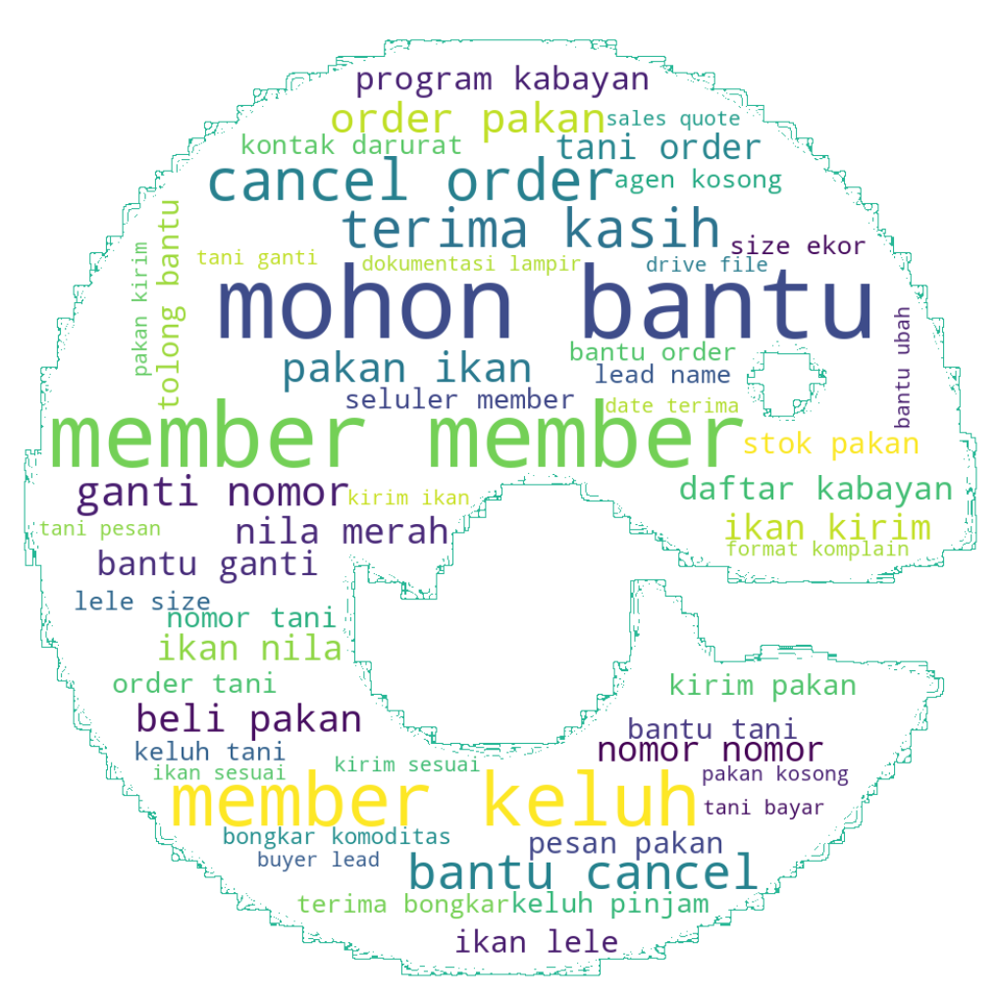

In [16]:
# Create WordCloud Visualization
wordcloud = WordCloud(
    width = 2000,
    height = 1000,
    mask = image_mask,
    contour_color = '#27B796',
    contour_width=1,
    background_color = 'white',
    max_words=100).generate_from_frequencies(frequencies=dict(freq_df_gram2[freq_df_gram2.Frequency > iqr][['Word', 'Frequency']].values))
fig = plt.figure(
    figsize = (10, 15),
    facecolor = 'w',
    edgecolor = 'w')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [17]:
# Result of Most Important Word 
freq_df_gram2[freq_df_gram2.Frequency > iqr][['Word', 'Frequency']].sort_values(by='Frequency', ascending=False)

,Word,Frequency
15140,mohon bantu,924
14618,member member,869
14609,member keluh,550
3675,cancel order,310
24186,terima kasih,266
1742,bantu cancel,220
16726,order pakan,159
7046,ganti nomor,159
17291,pakan ikan,157
2562,beli pakan,128


### All Text per Categories

#### N-Gram 1

In [18]:
# N-Gram 1
categories_df = []
for category in list(dataset['category'].unique()):
    freq_df = word_frequencies(dataset[dataset['category']== category], 'description', category, 1)
    categories_df.append(freq_df)

# Combine all frequency DataFrames into one
categories_ngram1 = pd.concat(categories_df, ignore_index=True)

In [19]:
categories_ngram1.sort_values(by='Frequency', ascending=False)

,Word,Frequency,Type
3809,member,682,Kabayan
3423,kabayan,628,Kabayan
8668,ikan,621,Beli Ikan
10798,order,615,Cancel Order
6038,nomor,520,Aplikasi
...,...,...,...
4477,sragen,1,Kabayan
4476,spek,1,Kabayan
4475,source,1,Kabayan
4474,sorong,1,Kabayan


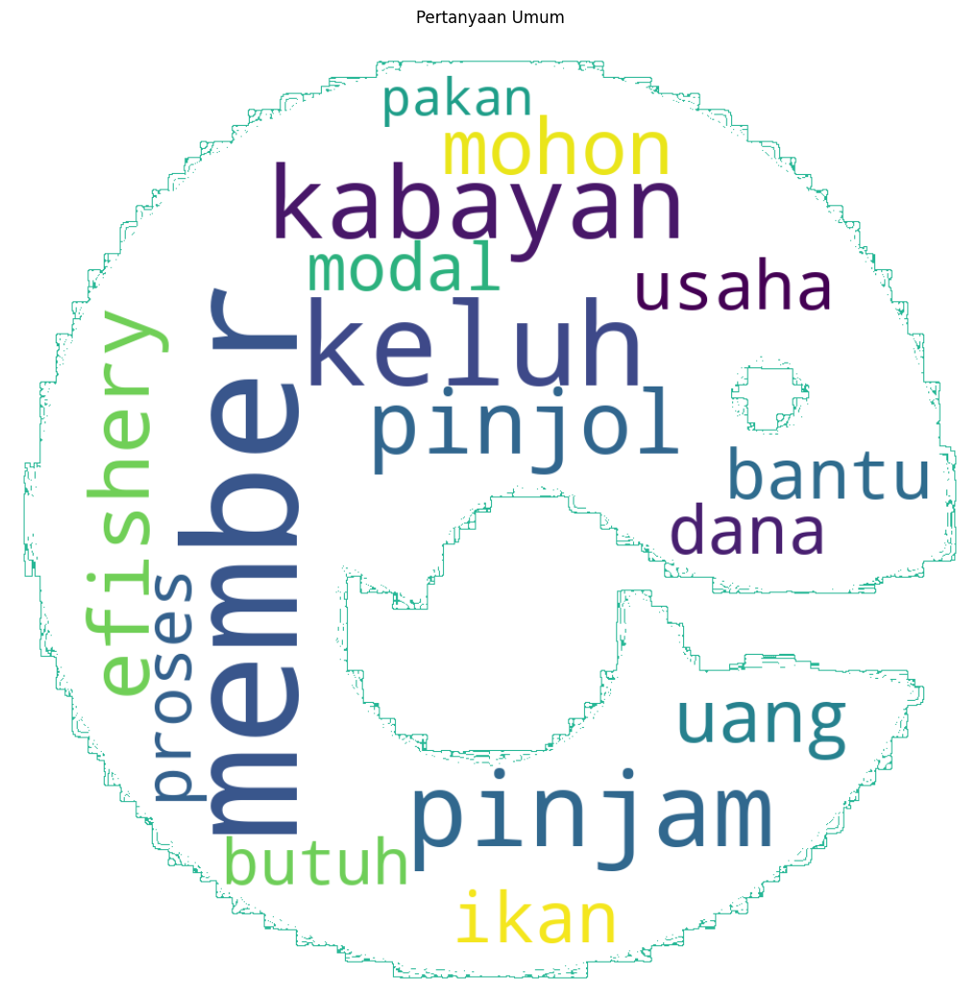

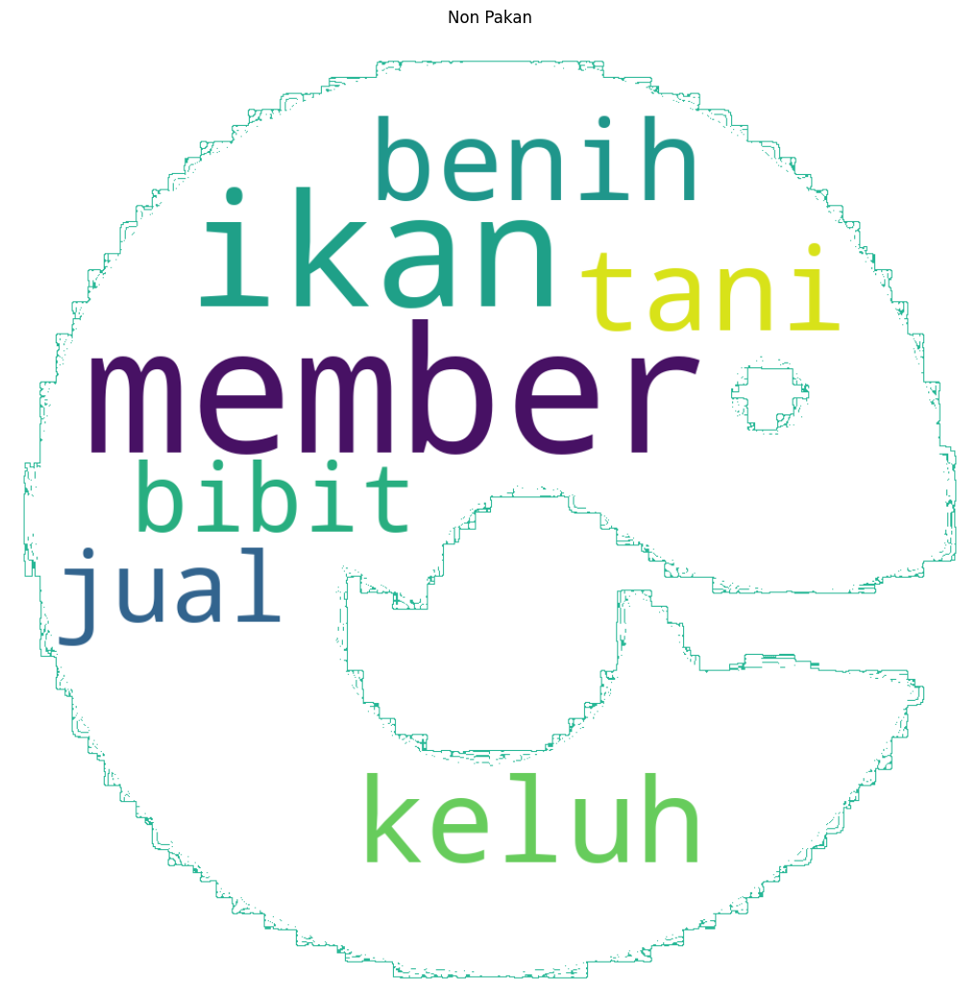

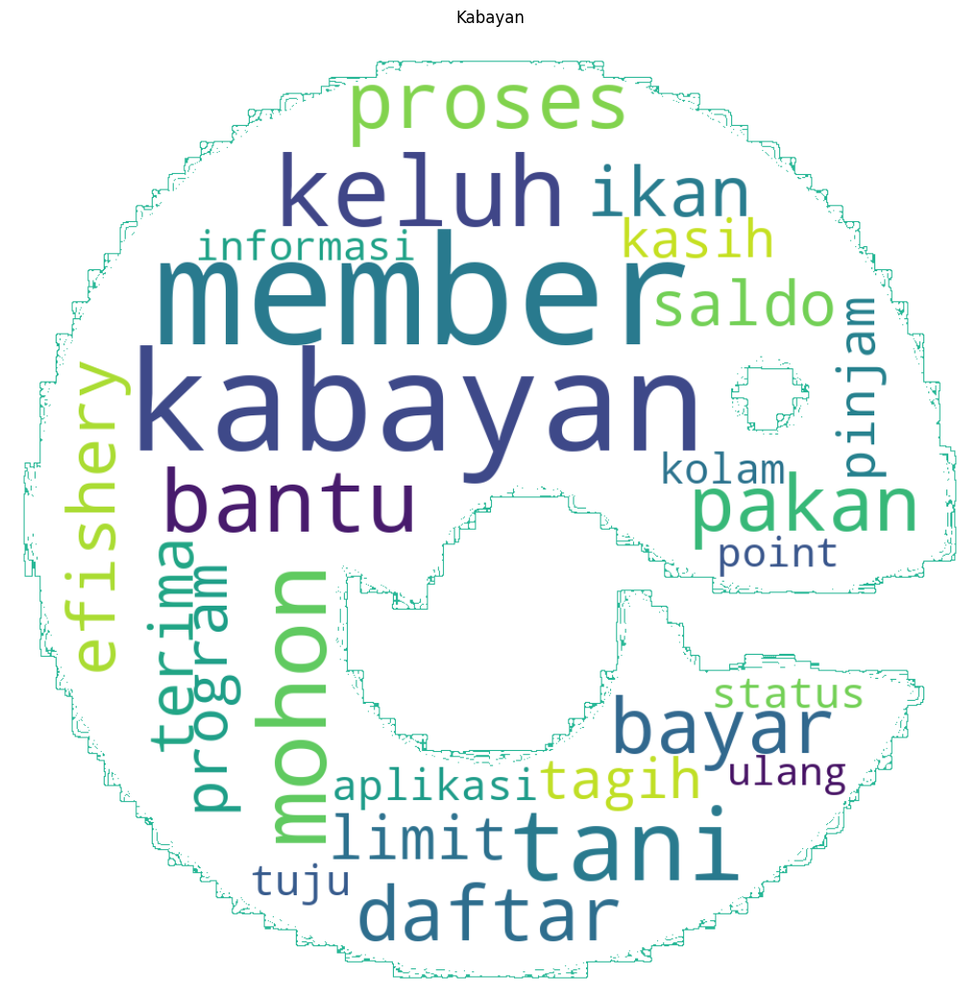

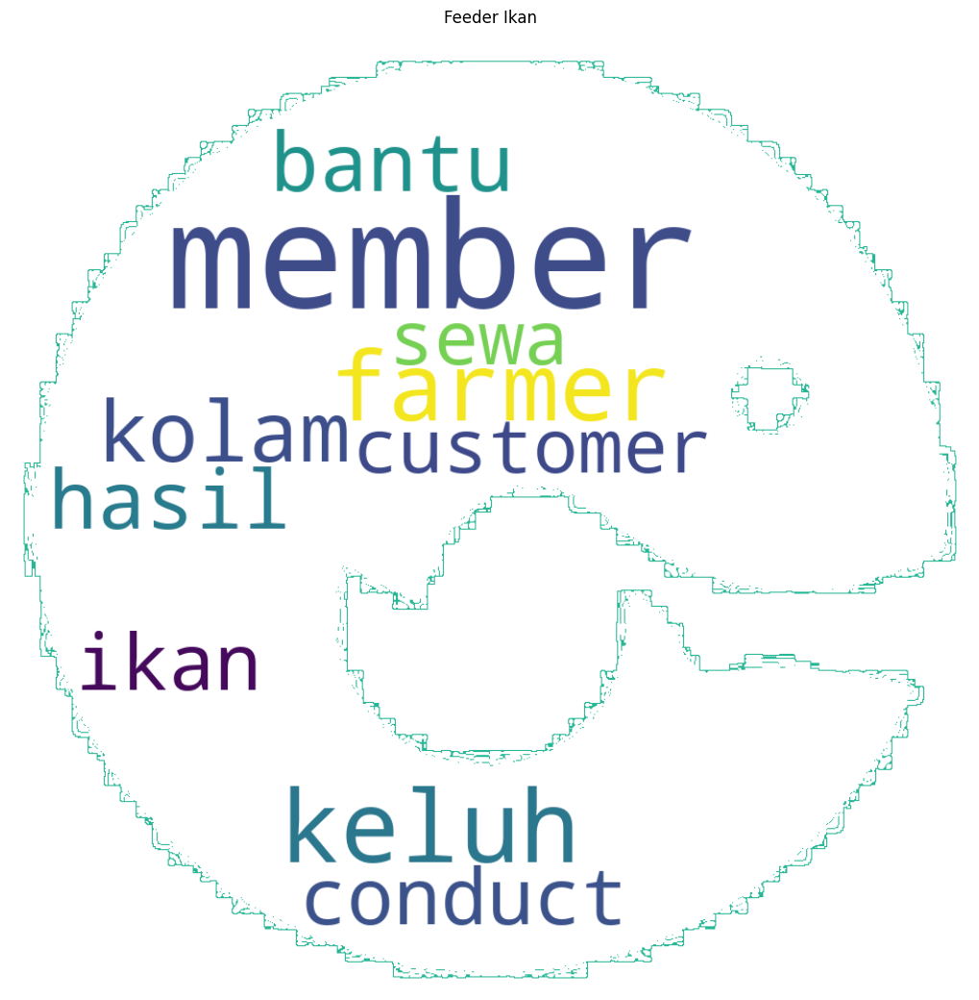

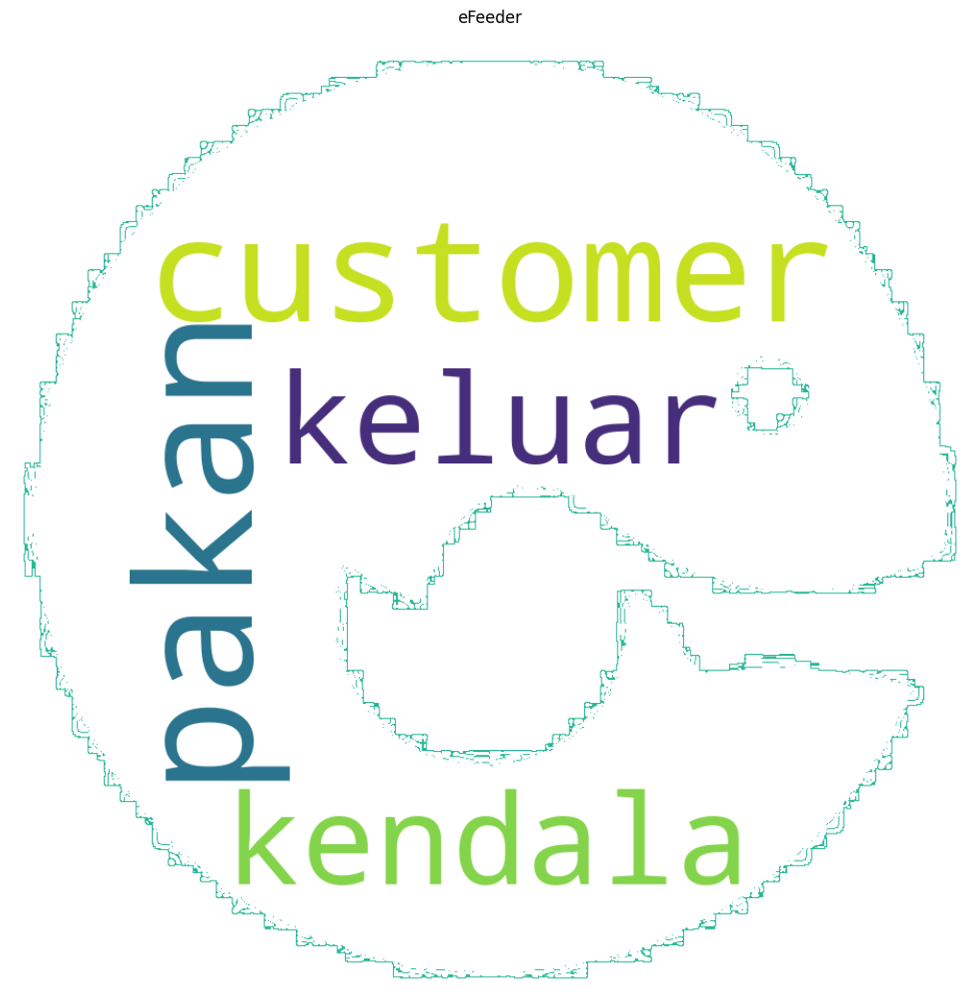

...

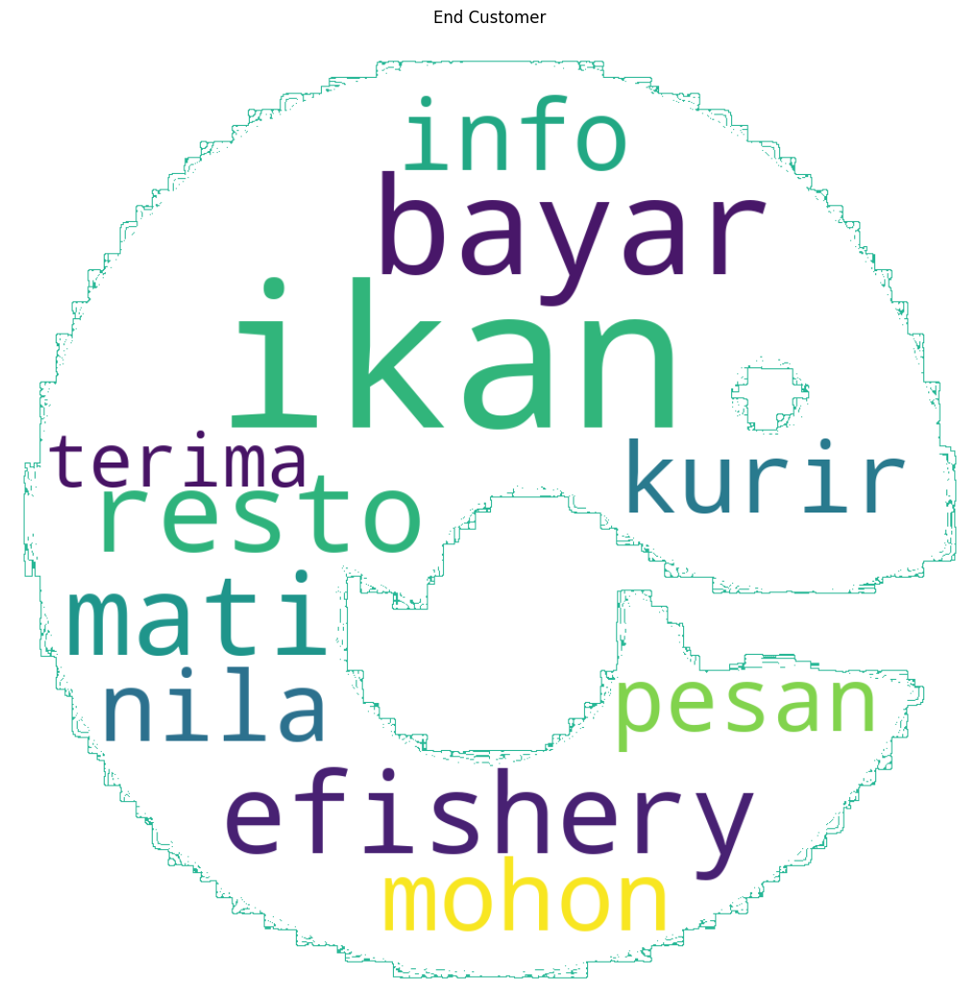

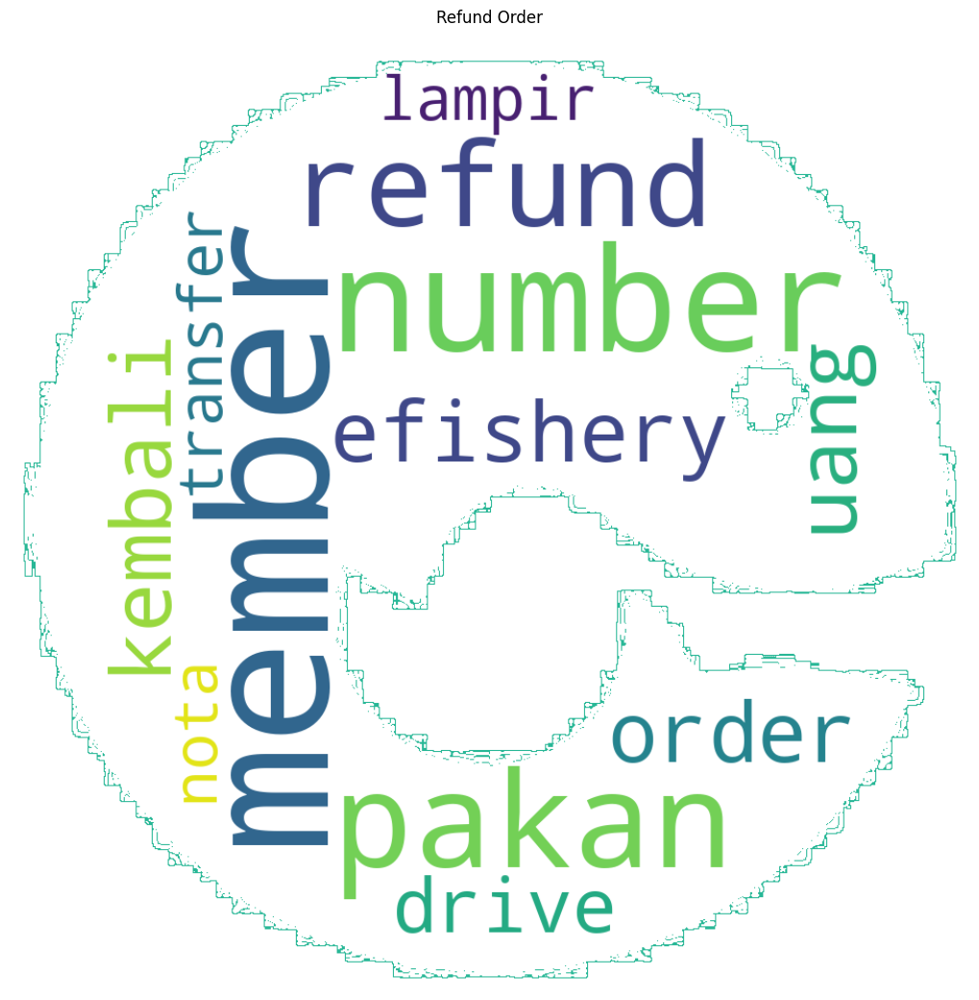

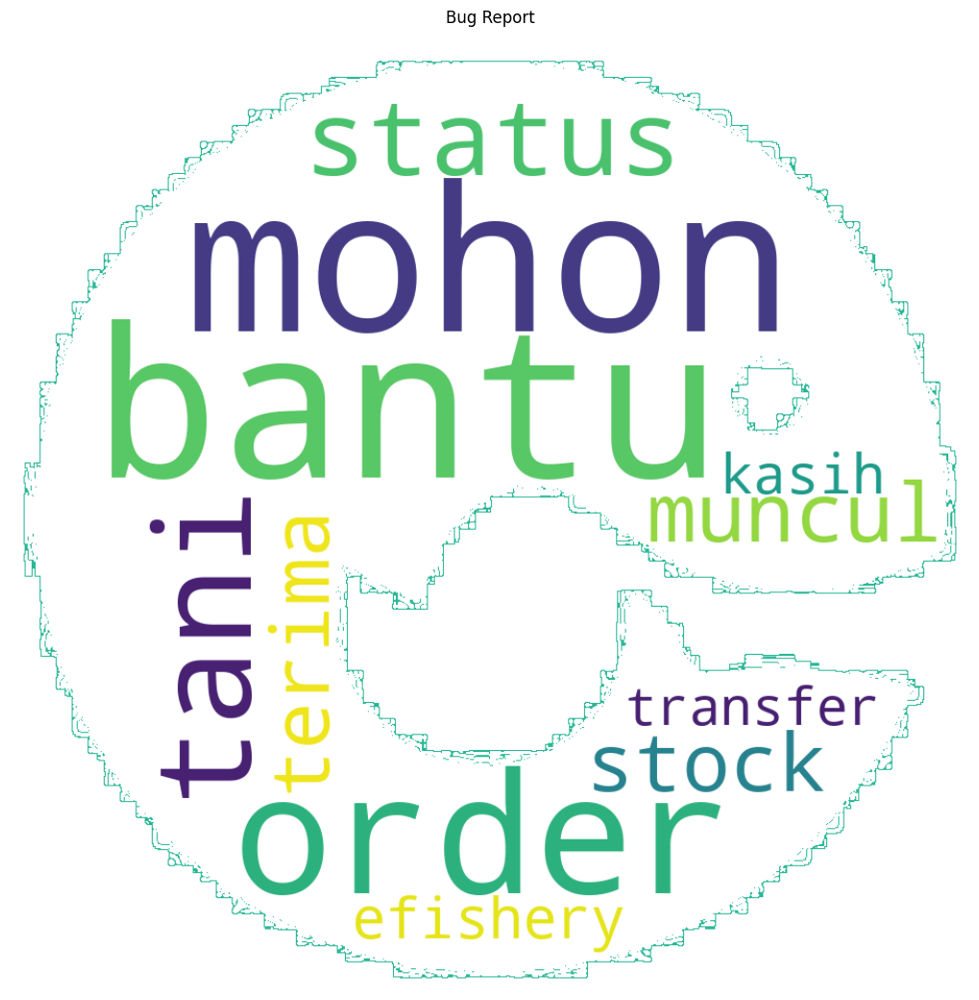

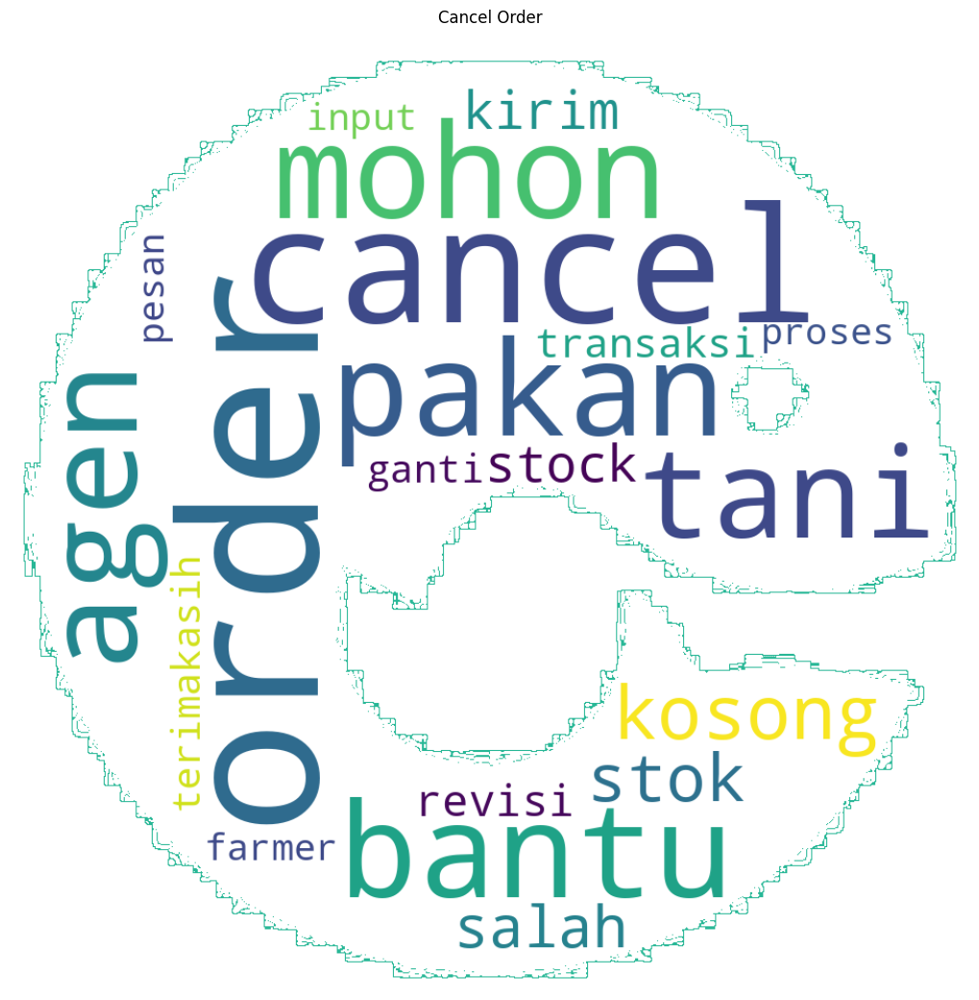

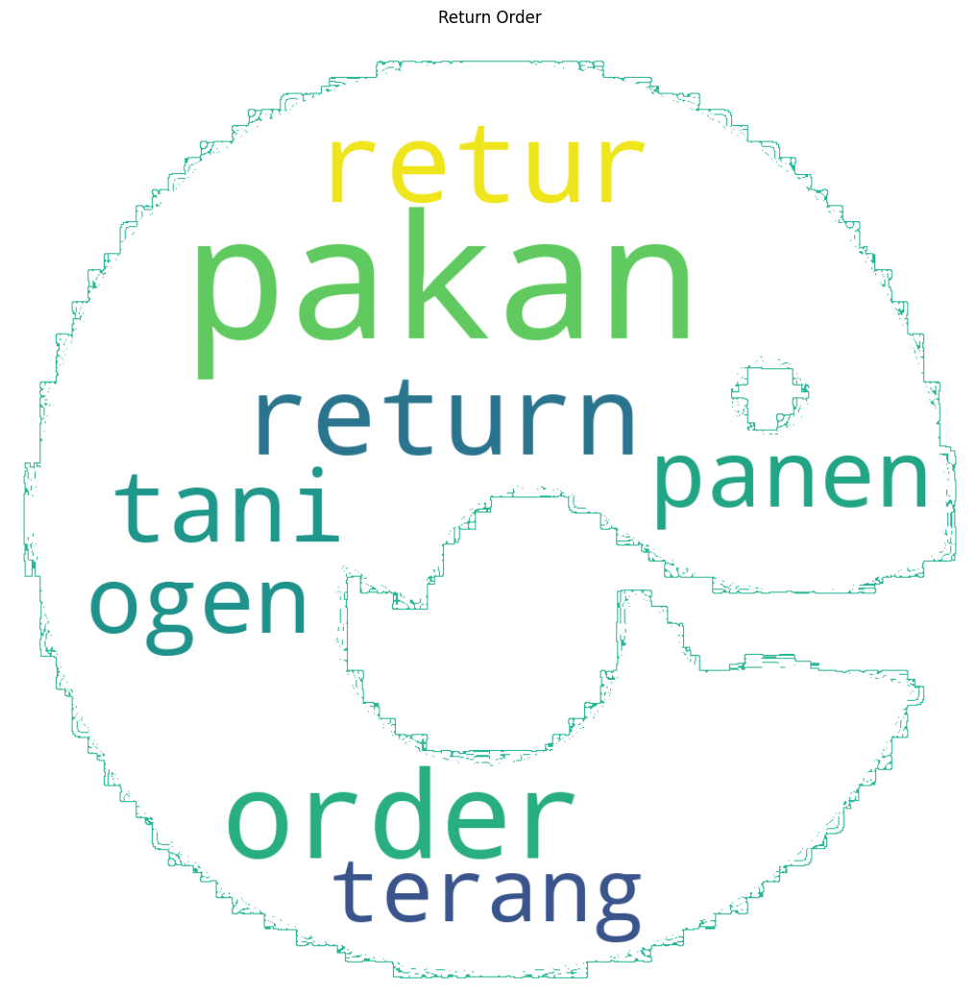

In [20]:
# Create Word Cloud Viz for every type Category
for type in categories_ngram1['Type'].unique():
    q75, q25 = np.percentile(categories_ngram1[categories_ngram1['Type']== type]['Frequency'].unique(), [75 ,25])
    iqr = q75 - q25

    text = dict(categories_ngram1[(categories_ngram1['Type']== type) & (categories_ngram1['Frequency']>iqr)][['Word','Frequency']].values)

    # Create WordCloud Visualization
    try:
        wordcloud = WordCloud(
        width = 2000,
        height = 1000,
        mask = image_mask,
        contour_color = '#27B796',
        contour_width=1,
        background_color = 'white',
        max_words=100).generate_from_frequencies(frequencies = text)
        fig = plt.figure(figsize = (10, 15),
                 facecolor = 'w',
                 edgecolor = 'w')
        plt.imshow(wordcloud, interpolation = 'bilinear')
        plt.title(type)
        plt.axis('off')
        plt.tight_layout(pad=0)
        plt.show()
    except:
        continue

#### N-Gram 2

In [21]:
# N-Gram 2
categories_df = []
for category in list(dataset['category'].unique()):
    freq_df = word_frequencies(dataset[dataset['category']== category], 'description', category, 2)
    categories_df.append(freq_df)

# Combine all frequency DataFrames into one
categories_ngram2 = pd.concat(categories_df, ignore_index=True)

In [22]:
categories_ngram2.sort_values(by='Frequency', ascending=False)

,Word,Frequency,Type
9758,member member,373,Kabayan
27865,cancel order,268,Cancel Order
15447,mohon bantu,265,Aplikasi
28979,mohon bantu,250,Cancel Order
2924,member member,247,Pertanyaan Umum
...,...,...,...
10851,proses status,1,Kabayan
10850,proses solusi,1,Kabayan
10849,proses smlm,1,Kabayan
10848,proses skrg,1,Kabayan


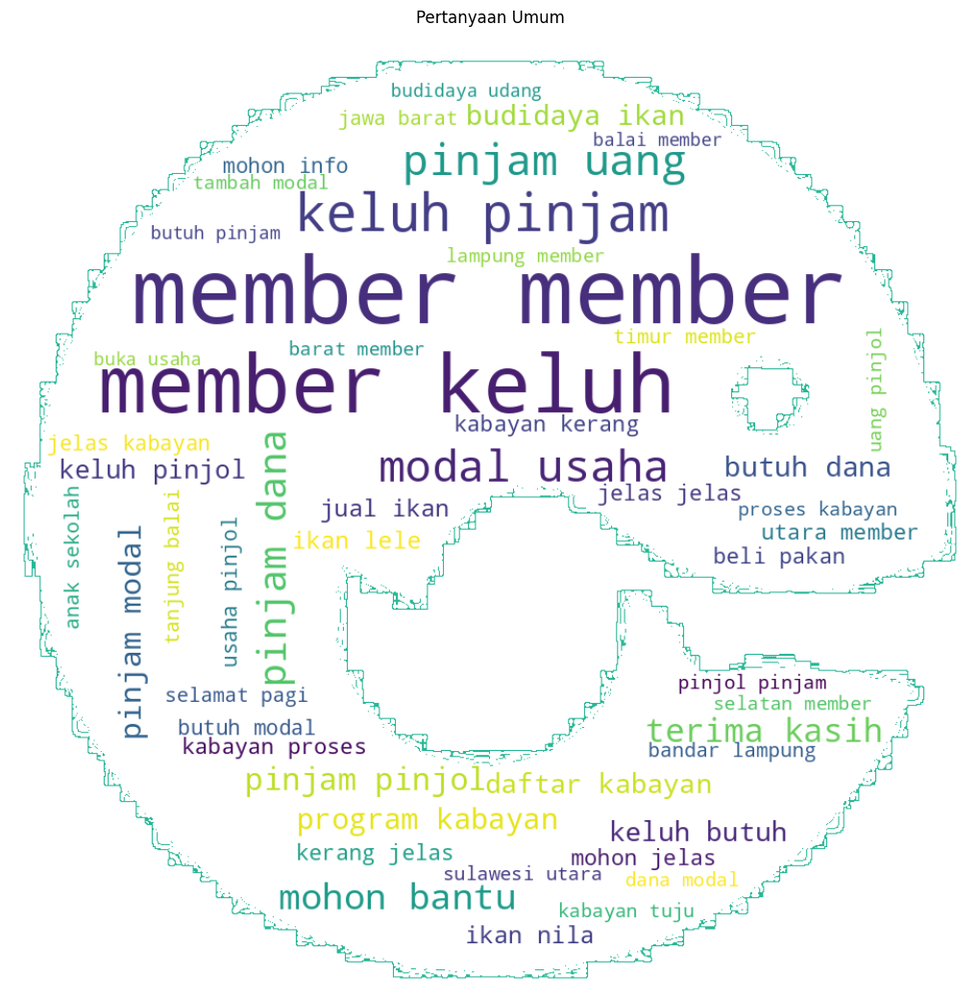

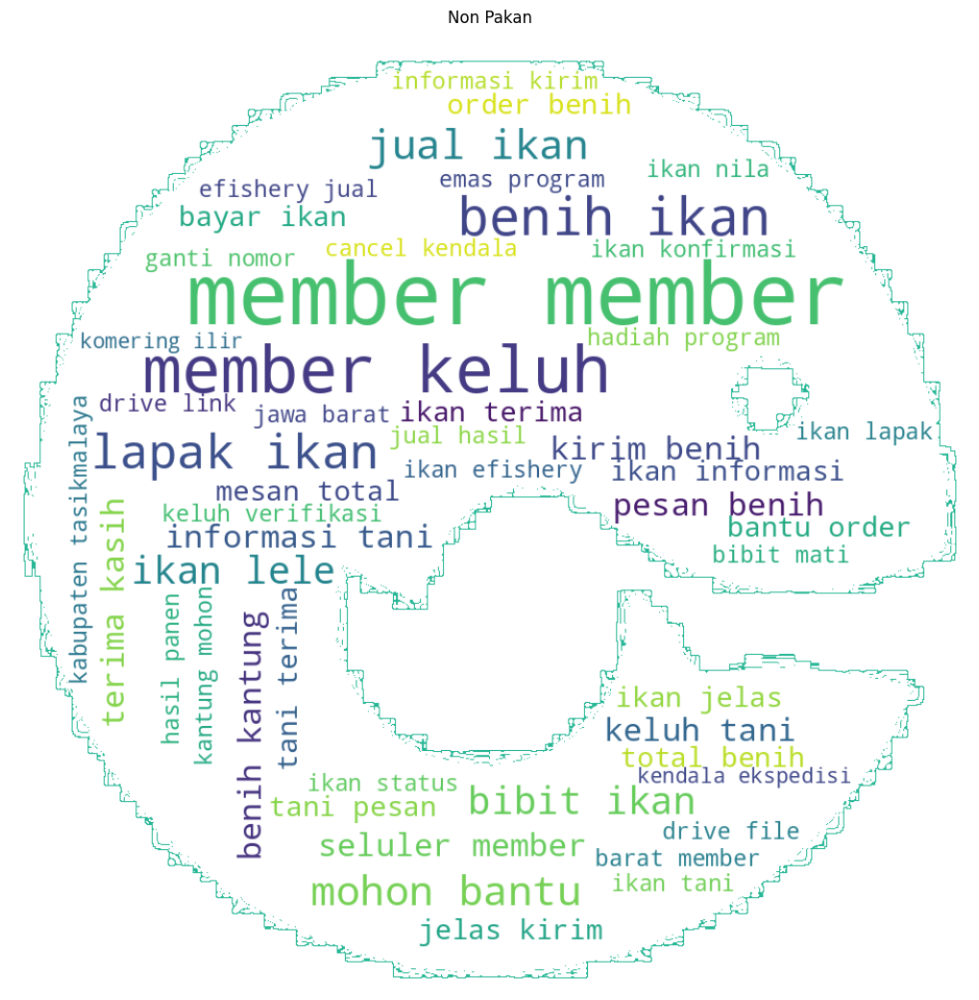

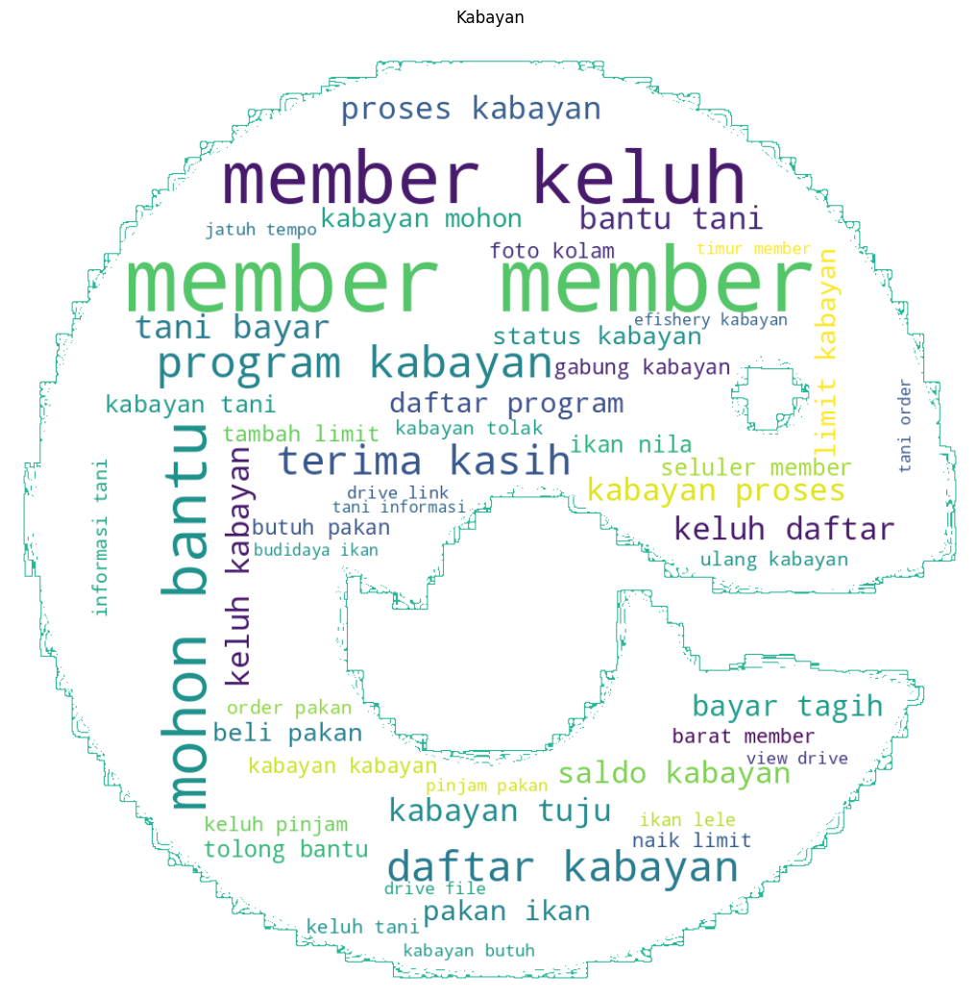

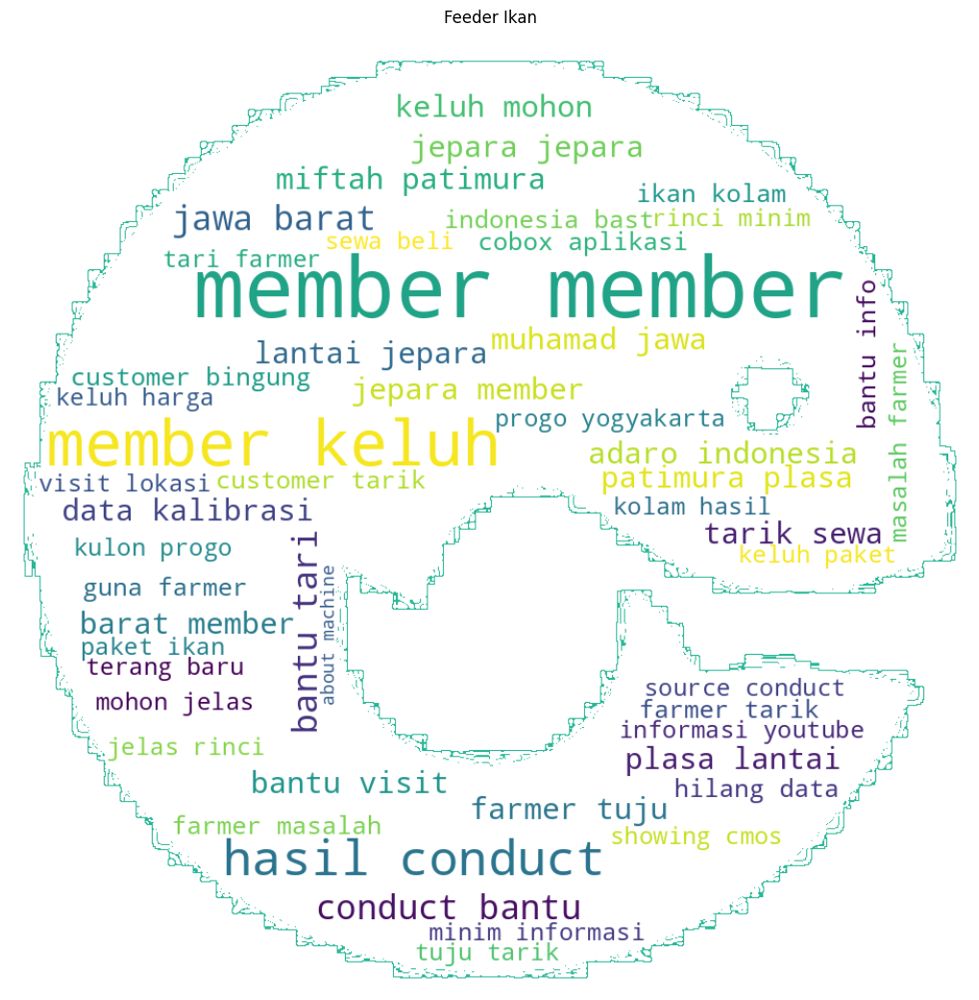

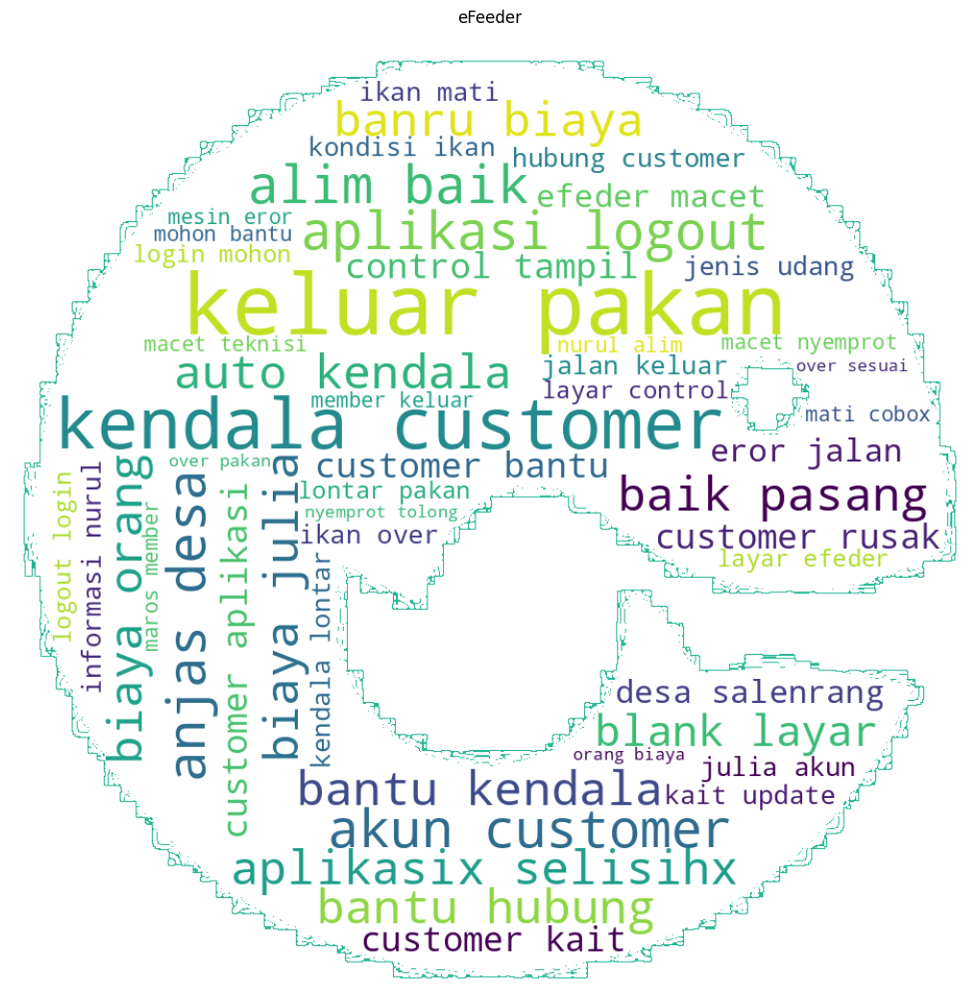

...

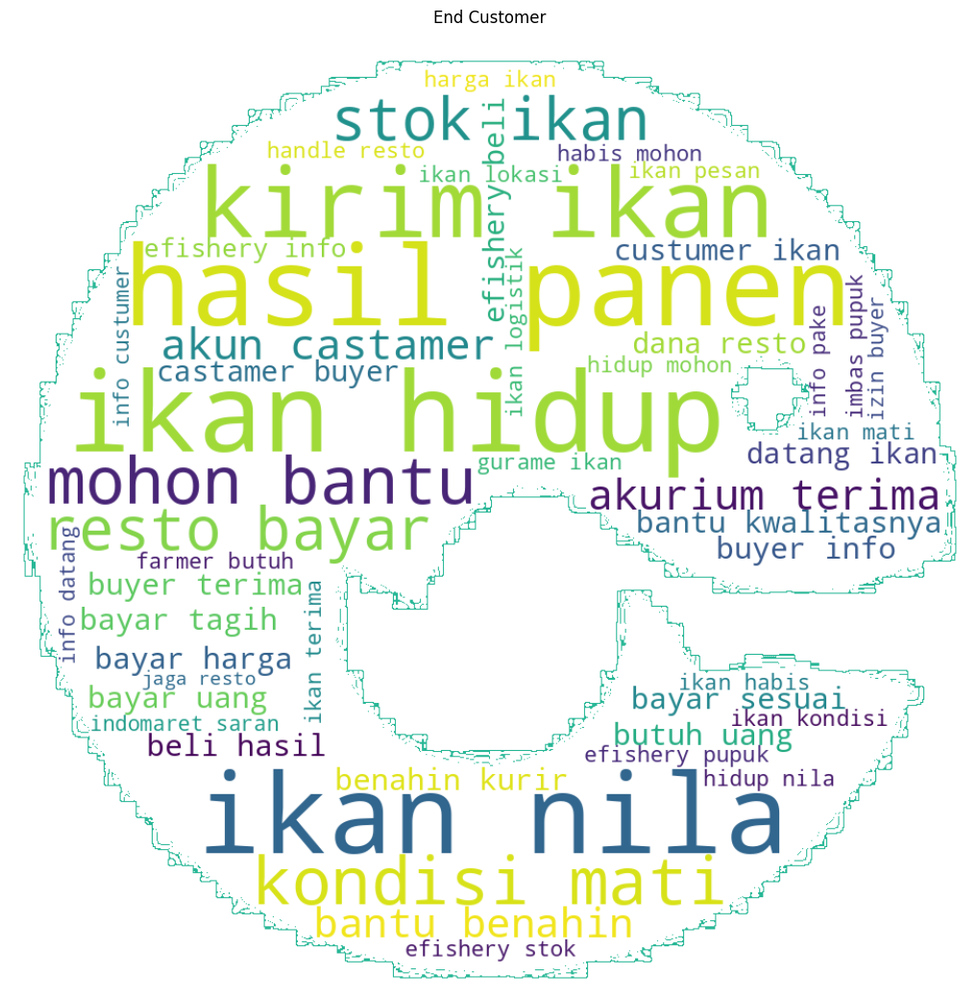

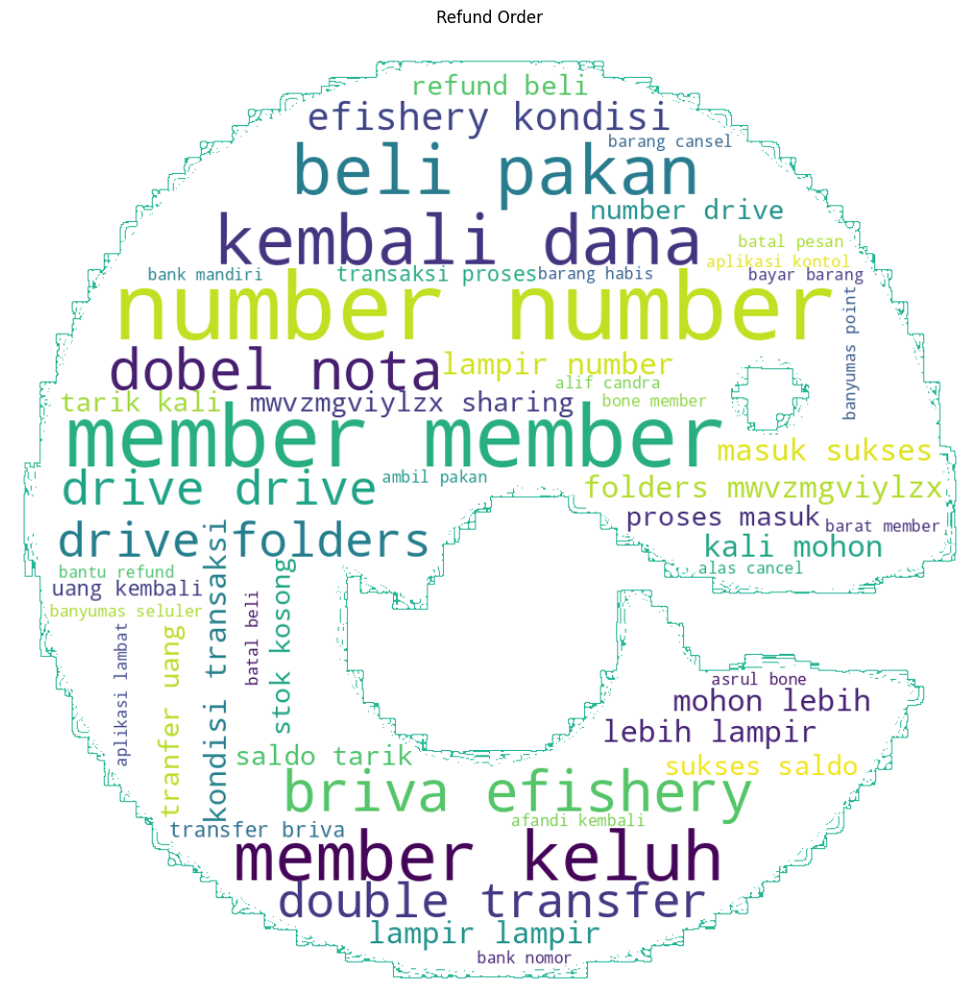

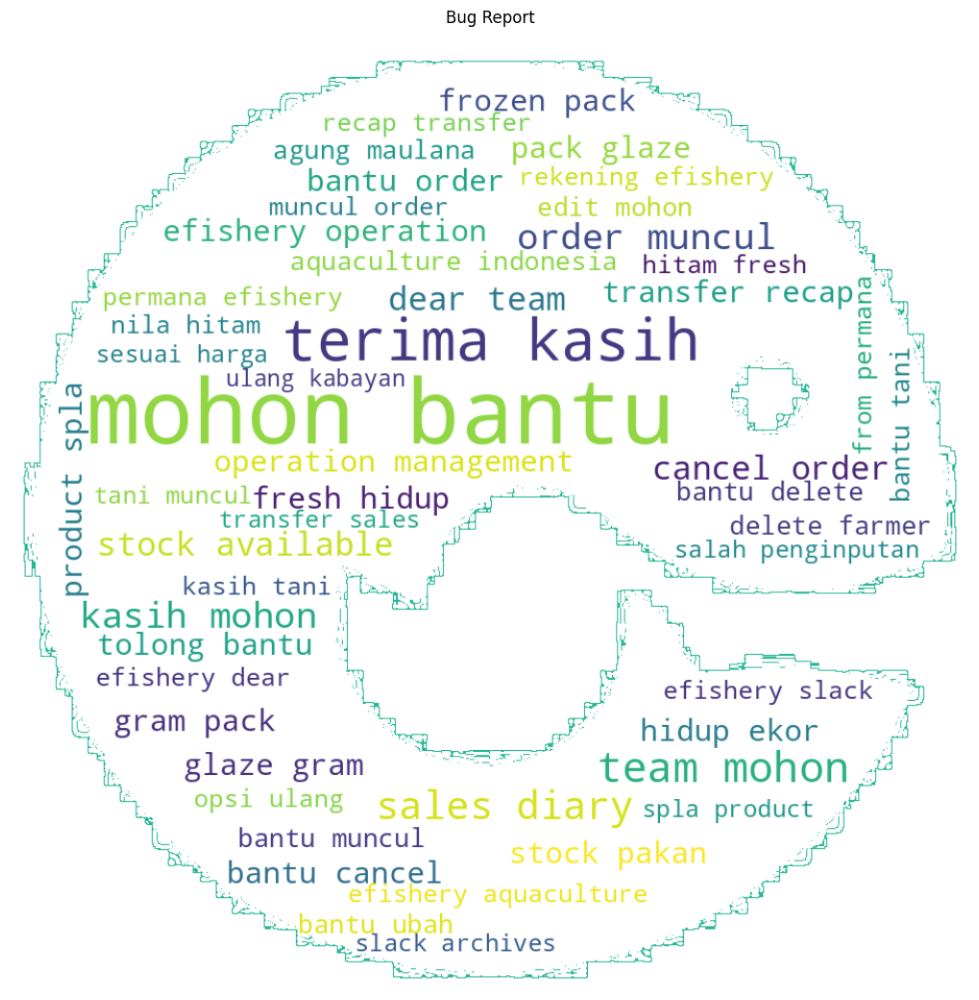

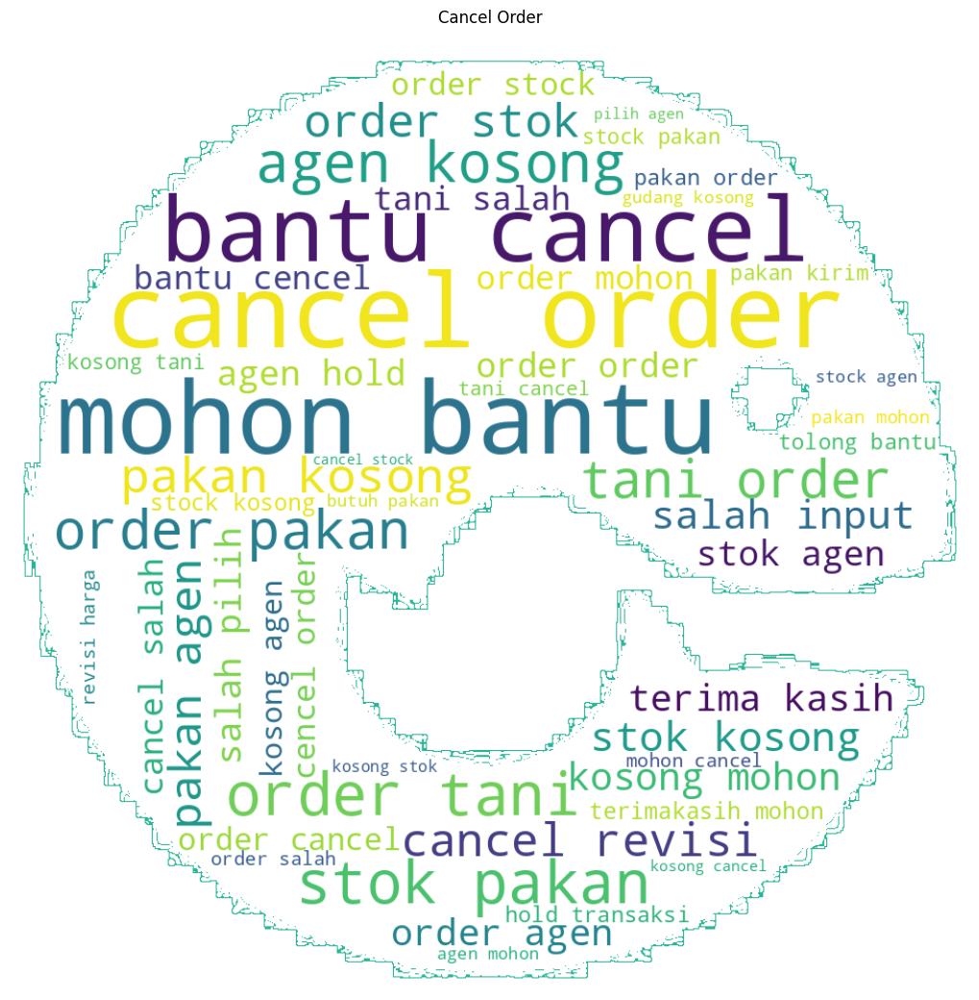

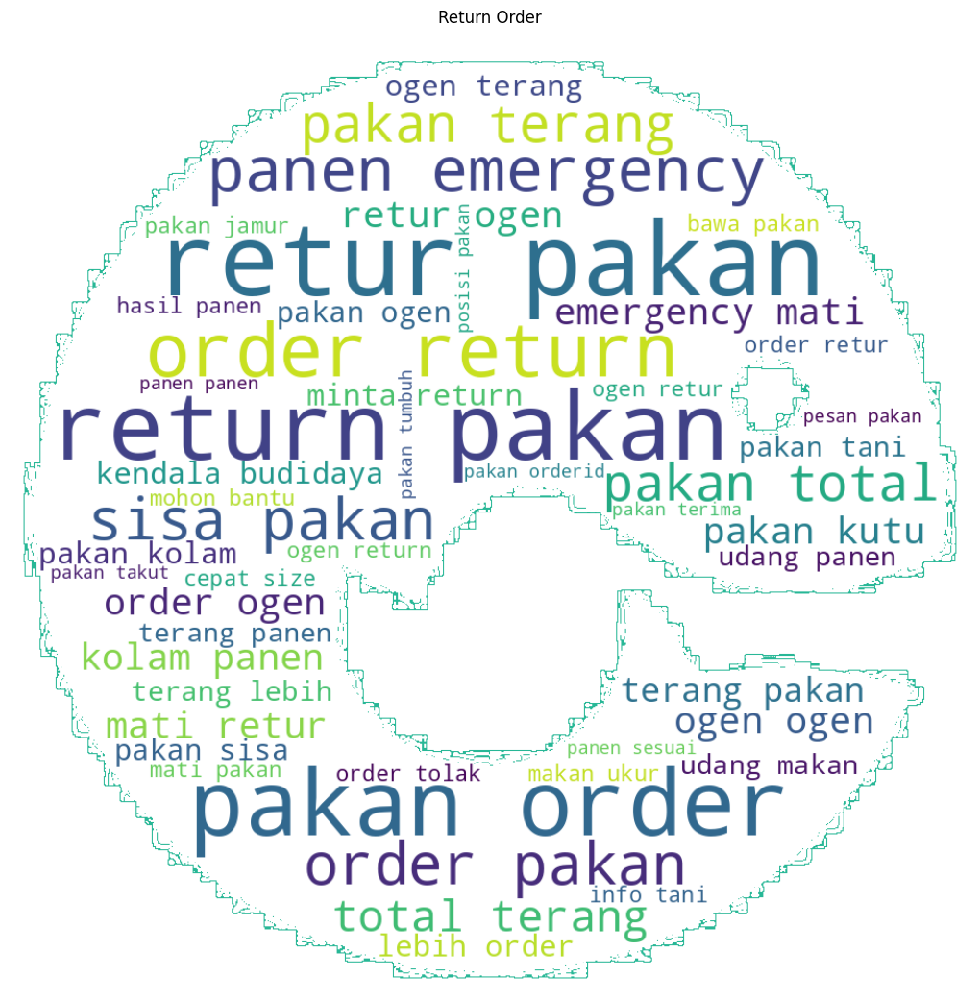

In [23]:
# Create Word Cloud Viz for every type Category
for type in categories_ngram2['Type'].unique():
    text = dict(categories_ngram2[categories_ngram2['Type']== type][['Word','Frequency']].values)

    # Create WordCloud Visualization
    try:
        wordcloud = WordCloud(
        width = 2000,
        height = 1000,
        mask = image_mask,
        contour_color = '#27B796',
        contour_width=1,
        background_color = 'white',
        max_words=50).generate_from_frequencies(frequencies = text)
        fig = plt.figure(figsize = (10, 15),
                 facecolor = 'w',
                 edgecolor = 'w')
        plt.imshow(wordcloud, interpolation = 'bilinear')
        plt.title(type)
        plt.axis('off')
        plt.tight_layout(pad=0)
        plt.show()
    except:
        continue